<a href="https://colab.research.google.com/github/YuriiKlim/Projects/blob/Clothing_Classifier/clothing_classifier_280k.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [74]:
import os
import sys
import shutil
import torch
import torch.nn as nn
import torch.nn.functional as F
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image
from io import BytesIO
from urllib.request import urlopen
from torchvision import datasets, transforms, models
from torch.utils.data import DataLoader, random_split
from sklearn.metrics import accuracy_score, ConfusionMatrixDisplay
import requests
from concurrent.futures import ThreadPoolExecutor
import random

import SegCloth
from SegCloth import segment_clothing

from PIL import ImageFile
ImageFile.LOAD_TRUNCATED_IMAGES = True

os.environ['CUDA_LAUNCH_BLOCKING'] = '1'
os.environ['TORCH_USE_CUDA_DSA'] = '1'


device = "cuda" if torch.cuda.is_available() else "cpu"
torch.set_default_device(device)
generator = torch.Generator(device='cuda')

torch.manual_seed(0)

In [75]:
df = pd.read_csv('C:/Users/klimk/Desktop/Project/products_final.csv')
#df = pd.read_csv('C:/Users/klimk/Desktop/Nike/NikeOnly.csv')

In [76]:
df

,sku,Type,Color,Season,Gender,Brand
0,М990GL6,Sneakers,Grey,Demi-season,Male,New Balance
1,М2002RJX,Sneakers,Grey,Demi-season,Male,New Balance
2,ЕЕ5364,Sneakers,Black,Demi-season,Female,Adidas
3,ZXNCSMM1013-BLACK,Track-jacket,Black,Demi-season,Male,Castore
4,ZWFB8P557-ORS,Longsleeve,Black,Demi-season,Female,Nike
...,...,...,...,...,...,...
279891,"1,10E-42",Sneakers,Grey,Demi-season,Male,Brooks
279892,"1,10E-42",Sneakers,Black,Demi-season,Male,Brooks
279893,"1,10E-53",Sneakers,Black,Demi-season,Male,Brooks
279894,"1,10E-61",Sneakers,Grey,Demi-season,Male,Brooks


In [77]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 279896 entries, 0 to 279895
Data columns (total 6 columns):
 #   Column  Non-Null Count   Dtype 
---  ------  --------------   ----- 
 0   sku     279896 non-null  object
 1   Type    279896 non-null  object
 2   Color   279896 non-null  object
 3   Season  279896 non-null  object
 4   Gender  279896 non-null  object
 5   Brand   279894 non-null  object
dtypes: object(6)
memory usage: 12.8+ MB


In [78]:
type_counts = df['Type'].value_counts()
type_counts

Type
Sneakers             78818
T-shirt              41997
Pants                21906
Shorts               18042
Hoodie               15596
Jacket               11747
Gumshoes              9999
Sweatshirt            8616
Longsleeve            6823
Slippers              5917
Sweater               5788
Tank-top              5171
Boots                 5050
Leggings              4184
Top                   3914
Polo                  3906
Football boots        3832
Track-jacket          3645
Full-zip Hoodie       3581
Shirt                 3574
Football sneakers     2004
Cap                   1987
Puffer jacket         1885
Sandals               1743
Backpack              1637
Shoes                 1504
Vest                  1464
Dress                 1292
Hat                    970
Skirt                  835
Bomber                 821
Parka                  746
High boot              510
Anorak                 392
Name: count, dtype: int64

In [79]:
type_counts = df['Color'].value_counts()
type_counts

Color
Black                  71932
White                  37981
Blue                   28215
Grey                   23429
Beige                  17411
                       ...  
Purple/Bordo               1
Bordo/Olive                1
Metallic/Light-Blue        1
Peach/Pink                 1
Red/Turquoise              1
Name: count, Length: 371, dtype: int64

In [80]:
img_size = 224
batch_size = 512

In [81]:
transform = transforms.Compose([
    transforms.Resize((img_size, img_size)),
    transforms.ToTensor(),
])

In [82]:
import cv2
from ultralytics import YOLO


class PhotoProcessing:
    def __init__(self, yolo_model_path='yolov8n.pt', data_dir='C:/Users/klimk/Desktop/Project/Main',
                 output_size=(800, 800), save_dir='C:/Users/klimk/Desktop/Nike/processed_all', device='cuda'):
        self.model = YOLO(yolo_model_path)
        self.data_dir = data_dir
        self.output_size = output_size
        self.save_dir = save_dir
        self.device = device
        self.model.to(self.device)
        self.processed_images = {}
        self.person_class_id = self._get_person_class_id()

        if not os.path.exists(self.save_dir):
            os.makedirs(self.save_dir)

    def _get_person_class_id(self):
        for class_id, class_name in self.model.names.items():
            if class_name == 'person':
                return class_id
        raise ValueError("Class 'person' not found in model classes")

    def load_image(self, file_name):
        file_path = os.path.join(self.data_dir, file_name + '.jpg')
        if os.path.exists(file_path):
            for attempt in range(3):
                try:
                    image = Image.open(file_path).convert("RGB")
                    return image
                except OSError as e:
                    print(f"Error loading image: {file_path}. Retrying... (Attempt {attempt + 1}) - Error: {e}")
            print(f"Failed to load image after multiple attempts: {file_path}")
            return None
        else:
            print(f"File does not exist: {file_path}")
            return None

    def resize_for_yolo(self, image):
        width, height = image.size
        new_width = (width // 32) * 32
        new_height = (height // 32) * 32
        resized_image = image.resize((new_width, new_height))
        return resized_image

    def process_image(self, image, sku):
        image_resized = self.resize_for_yolo(image)

        output_image_rgb = np.array(image_resized)
        output_image_tensor = torch.from_numpy(output_image_rgb).permute(2, 0, 1).float() / 255.0
        output_image_tensor = output_image_tensor.unsqueeze(0).to(self.device)

        results = self.model(output_image_tensor)

        detections = results[0].boxes.data.cpu().numpy()

        person_detected = any(int(detection[5]) == self.person_class_id for detection in detections)

        if person_detected:
            processed_image = self.apply_segcloth(image_resized)
        else:
            processed_image = self.apply_white_background(image_resized)

        processed_image = processed_image.resize(self.output_size)
        self.processed_images[sku] = processed_image

        self.save_image(processed_image, sku)

    def apply_segcloth(self, image):
        result = segment_clothing(img=image)
        return result

    def apply_white_background(self, image):
        image_cv = cv2.cvtColor(np.array(image), cv2.COLOR_RGB2BGR)

        mask = np.zeros(image_cv.shape[:2], np.uint8)
        bgdModel = np.zeros((1, 65), np.float64)
        fgdModel = np.zeros((1, 65), np.float64)
        rect = (10, 10, image_cv.shape[1] - 10, image_cv.shape[0] - 10)
        cv2.grabCut(image_cv, mask, rect, bgdModel, fgdModel, 5, cv2.GC_INIT_WITH_RECT)

        mask2 = np.where((mask == 2) | (mask == 0), 0, 1).astype('uint8')
        output_image = image_cv.copy()
        output_image[mask2 == 0] = [255, 255, 255]

        output_image_rgb = cv2.cvtColor(output_image, cv2.COLOR_BGR2RGB)
        return Image.fromarray(output_image_rgb)

    def save_image(self, image, sku):
        output_path = os.path.join(self.save_dir, f'{sku}.jpg')
        image.save(output_path)

    def process_images(self, skus):
        for sku in skus:
            image = self.load_image(sku)
            if image is not None:
                self.process_image(image, sku)
            else:
                print(f"Skipping SKU: {sku} due to image loading failure.")

    def get_processed_images(self):
        return self.processed_images

In [83]:
def process_image_generator(skus, processor):
    processor.process_images(skus)
    processed_images = processor.get_processed_images()
    for sku in skus:
        if sku in processed_images:
            yield sku, processed_images[sku]

In [84]:
from tqdm import tqdm
from concurrent.futures import ThreadPoolExecutor

processor = PhotoProcessing()

all_valid_skus = []
total_batches = len(df['sku']) // batch_size + 1

with ThreadPoolExecutor(max_workers=12) as executor:
    for i in tqdm(range(0, len(df['sku']), batch_size), desc="Processing Batches", total=total_batches):
        batch_skus = df['sku'][i:i + batch_size]

        results = list(executor.map(lambda skus: list(process_image_generator(skus, processor)), [batch_skus]))

        for result in results:
            for sku, image in result:
                all_valid_skus.append(sku)

df = df[df['sku'].isin(all_valid_skus)].reset_index(drop=True)

sku_count = df['sku'].count()
print(f"Total valid SKUs: {sku_count}")

Processing Batches:   0%|                                                              | 1/547 [00:00<00:59,  9.13it/s]

File does not exist: C:/Users/klimk/Desktop/Project/Main\М990GL6.jpg
Skipping SKU: М990GL6 due to image loading failure.
File does not exist: C:/Users/klimk/Desktop/Project/Main\М2002RJX.jpg
Skipping SKU: М2002RJX due to image loading failure.
File does not exist: C:/Users/klimk/Desktop/Project/Main\ЕЕ5364.jpg
Skipping SKU: ЕЕ5364 due to image loading failure.
File does not exist: C:/Users/klimk/Desktop/Project/Main\ZXNCSMM1013-BLACK.jpg
Skipping SKU: ZXNCSMM1013-BLACK due to image loading failure.
File does not exist: C:/Users/klimk/Desktop/Project/Main\ZWFB8P557-ORS.jpg
Skipping SKU: ZWFB8P557-ORS due to image loading failure.
File does not exist: C:/Users/klimk/Desktop/Project/Main\ZWF8933P984H-WNS.jpg
Skipping SKU: ZWF8933P984H-WNS due to image loading failure.
File does not exist: C:/Users/klimk/Desktop/Project/Main\ZWF8933P984H-SOU.jpg
Skipping SKU: ZWF8933P984H-SOU due to image loading failure.
File does not exist: C:/Users/klimk/Desktop/Project/Main\ZWF8933P984H-PRV.jpg
Skippin

Processing Batches:   3%|█▊                                                           | 16/547 [00:00<00:09, 56.51it/s]

File does not exist: C:/Users/klimk/Desktop/Project/Main\WARISCY3.jpg
Skipping SKU: WARISCY3 due to image loading failure.
File does not exist: C:/Users/klimk/Desktop/Project/Main\WARISCW3.jpg
Skipping SKU: WARISCW3 due to image loading failure.
File does not exist: C:/Users/klimk/Desktop/Project/Main\WARISCR3.jpg
Skipping SKU: WARISCR3 due to image loading failure.
File does not exist: C:/Users/klimk/Desktop/Project/Main\WARISCP3.jpg
Skipping SKU: WARISCP3 due to image loading failure.
File does not exist: C:/Users/klimk/Desktop/Project/Main\WARISCM4.jpg
Skipping SKU: WARISCM4 due to image loading failure.
File does not exist: C:/Users/klimk/Desktop/Project/Main\WARISCL3.jpg
Skipping SKU: WARISCL3 due to image loading failure.
File does not exist: C:/Users/klimk/Desktop/Project/Main\WARISCE3.jpg
Skipping SKU: WARISCE3 due to image loading failure.
File does not exist: C:/Users/klimk/Desktop/Project/Main\WARISBW4.jpg
Skipping SKU: WARISBW4 due to image loading failure.
File does not ex

Processing Batches:   6%|███▍                                                         | 31/547 [00:00<00:07, 65.13it/s]

File does not exist: C:/Users/klimk/Desktop/Project/Main\VN0009QPBM8.jpg
Skipping SKU: VN0009QPBM8 due to image loading failure.
File does not exist: C:/Users/klimk/Desktop/Project/Main\VN0009QP4MG.jpg
Skipping SKU: VN0009QP4MG due to image loading failure.
File does not exist: C:/Users/klimk/Desktop/Project/Main\VN0009QP448.jpg
Skipping SKU: VN0009QP448 due to image loading failure.
File does not exist: C:/Users/klimk/Desktop/Project/Main\VN0009QP1M71.jpg
Skipping SKU: VN0009QP1M71 due to image loading failure.
File does not exist: C:/Users/klimk/Desktop/Project/Main\VN0009QP1M7.jpg
Skipping SKU: VN0009QP1M7 due to image loading failure.
File does not exist: C:/Users/klimk/Desktop/Project/Main\VN0009QN448.jpg
Skipping SKU: VN0009QN448 due to image loading failure.
File does not exist: C:/Users/klimk/Desktop/Project/Main\VN0009QMOLV.jpg
Skipping SKU: VN0009QMOLV due to image loading failure.
File does not exist: C:/Users/klimk/Desktop/Project/Main\VN0009QMJM9.jpg
Skipping SKU: VN0009QM

Processing Batches:   8%|█████▏                                                       | 46/547 [00:00<00:07, 67.49it/s]IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)

Processing Batches:  41%|████████████████████████▎                                   | 222/547 [00:03<00:04, 72.82it/s]IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)

Processing Batches:  44%|██████████████████████████                                  | 238/547 [00:03<00:04, 73.82it/s]

File does not exist: C:/Users/klimk/Desktop/Project/Main\FN2839-010.jpg
Skipping SKU: FN2839-010 due to image loading failure.
File does not exist: C:/Users/klimk/Desktop/Project/Main\FN2824-675.jpg
Skipping SKU: FN2824-675 due to image loading failure.
File does not exist: C:/Users/klimk/Desktop/Project/Main\FN2824-405.jpg
Skipping SKU: FN2824-405 due to image loading failure.
File does not exist: C:/Users/klimk/Desktop/Project/Main\FN2824-361.jpg
Skipping SKU: FN2824-361 due to image loading failure.
File does not exist: C:/Users/klimk/Desktop/Project/Main\FN2821-104.jpg
Skipping SKU: FN2821-104 due to image loading failure.
File does not exist: C:/Users/klimk/Desktop/Project/Main\FN2821-051.jpg
Skipping SKU: FN2821-051 due to image loading failure.
File does not exist: C:/Users/klimk/Desktop/Project/Main\FN2817-010.jpg
Skipping SKU: FN2817-010 due to image loading failure.
File does not exist: C:/Users/klimk/Desktop/Project/Main\FN2814-675.jpg
Skipping SKU: FN2814-675 due to image l

Processing Batches:  46%|███████████████████████████▊                                | 254/547 [00:03<00:03, 73.30it/s]

File does not exist: C:/Users/klimk/Desktop/Project/Main\FB5541-476.jpg
Skipping SKU: FB5541-476 due to image loading failure.
File does not exist: C:/Users/klimk/Desktop/Project/Main\FB5541-410.jpg
Skipping SKU: FB5541-410 due to image loading failure.
File does not exist: C:/Users/klimk/Desktop/Project/Main\FB5541-121.jpg
Skipping SKU: FB5541-121 due to image loading failure.
File does not exist: C:/Users/klimk/Desktop/Project/Main\FB5541-010.jpg
Skipping SKU: FB5541-010 due to image loading failure.
File does not exist: C:/Users/klimk/Desktop/Project/Main\FB5525-613.jpg
Skipping SKU: FB5525-613 due to image loading failure.
File does not exist: C:/Users/klimk/Desktop/Project/Main\FB5515-410.jpg
Skipping SKU: FB5515-410 due to image loading failure.
File does not exist: C:/Users/klimk/Desktop/Project/Main\FB5515-121.jpg
Skipping SKU: FB5515-121 due to image loading failure.
File does not exist: C:/Users/klimk/Desktop/Project/Main\FB5515-010.jpg
Skipping SKU: FB5515-010 due to image l

Processing Batches:  49%|█████████████████████████████▌                              | 270/547 [00:03<00:03, 74.87it/s]IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)

Processing Batches:  52%|███████████████████████████████▎                            | 286/547 [00:04<00:03, 75.63it/s]IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)

Processing Batches:  55%|█████████████████████████████████▏                          | 302/547 [00:04<00:03, 73.57it/s]I

File does not exist: C:/Users/klimk/Desktop/Project/Main\222PCNH-LT05-GY.jpg
Skipping SKU: 222PCNH-LT05-GY due to image loading failure.
File does not exist: C:/Users/klimk/Desktop/Project/Main\222PCNH-LT05-BK.jpg
Skipping SKU: 222PCNH-LT05-BK due to image loading failure.
File does not exist: C:/Users/klimk/Desktop/Project/Main\222PCKHN-LT02-WHT.jpg
Skipping SKU: 222PCKHN-LT02-WHT due to image loading failure.
File does not exist: C:/Users/klimk/Desktop/Project/Main\222PCKHN-LT02.jpg
Skipping SKU: 222PCKHN-LT02 due to image loading failure.
File does not exist: C:/Users/klimk/Desktop/Project/Main\222PCDT-ST04S-WH.jpg
Skipping SKU: 222PCDT-ST04S-WH due to image loading failure.
File does not exist: C:/Users/klimk/Desktop/Project/Main\222PCDT-ST04S-BK.jpg
Skipping SKU: 222PCDT-ST04S-BK due to image loading failure.
File does not exist: C:/Users/klimk/Desktop/Project/Main\222PCDT-ST03S-WH.jpg
Skipping SKU: 222PCDT-ST03S-WH due to image loading failure.
File does not exist: C:/Users/klimk

Processing Batches:  90%|██████████████████████████████████████████████████████▏     | 494/547 [00:06<00:00, 73.92it/s]

File does not exist: C:/Users/klimk/Desktop/Project/Main\1912423-999992.jpg
Skipping SKU: 1912423-999992 due to image loading failure.
File does not exist: C:/Users/klimk/Desktop/Project/Main\1912421-999000.jpg
Skipping SKU: 1912421-999000 due to image loading failure.
File does not exist: C:/Users/klimk/Desktop/Project/Main\1912421-992000.jpg
Skipping SKU: 1912421-992000 due to image loading failure.
File does not exist: C:/Users/klimk/Desktop/Project/Main\1912420-914992.jpg
Skipping SKU: 1912420-914992 due to image loading failure.
File does not exist: C:/Users/klimk/Desktop/Project/Main\1912420-396000.jpg
Skipping SKU: 1912420-396000 due to image loading failure.
File does not exist: C:/Users/klimk/Desktop/Project/Main\1912416-999000.jpg
Skipping SKU: 1912416-999000 due to image loading failure.
File does not exist: C:/Users/klimk/Desktop/Project/Main\1912219-950999.jpg
Skipping SKU: 1912219-950999 due to image loading failure.
File does not exist: C:/Users/klimk/Desktop/Project/Mai

Processing Batches:  92%|███████████████████████████████████████████████████████     | 502/547 [00:07<00:00, 73.62it/s]IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)

Processing Batches:  95%|████████████████████████████████████████████████████████▊   | 518/547 [00:07<00:00, 72.47it/s]

File does not exist: C:/Users/klimk/Desktop/Project/Main\1011B693-400.jpg
Skipping SKU: 1011B693-400 due to image loading failure.
File does not exist: C:/Users/klimk/Desktop/Project/Main\1011B693-300.jpg
Skipping SKU: 1011B693-300 due to image loading failure.
File does not exist: C:/Users/klimk/Desktop/Project/Main\1011B693-101.jpg
Skipping SKU: 1011B693-101 due to image loading failure.
File does not exist: C:/Users/klimk/Desktop/Project/Main\1011B693-003.jpg
Skipping SKU: 1011B693-003 due to image loading failure.
File does not exist: C:/Users/klimk/Desktop/Project/Main\1011B693-002.jpg
Skipping SKU: 1011B693-002 due to image loading failure.
File does not exist: C:/Users/klimk/Desktop/Project/Main\1011B693-001.jpg
Skipping SKU: 1011B693-001 due to image loading failure.
File does not exist: C:/Users/klimk/Desktop/Project/Main\1011B691-403.jpg
Skipping SKU: 1011B691-403 due to image loading failure.
File does not exist: C:/Users/klimk/Desktop/Project/Main\1011B691-402.jpg
Skipping 

Processing Batches:  98%|██████████████████████████████████████████████████████████▌ | 534/547 [00:07<00:00, 73.65it/s]IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



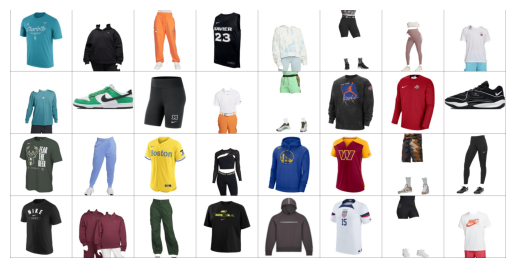

In [85]:
from torchvision.utils import make_grid

processed_images_dir = 'C:/Users/klimk/Desktop/Nike/processed'

processed_images_files = [os.path.join(processed_images_dir, f) for f in os.listdir(processed_images_dir) if f.endswith('.jpg')]

random_images_files = random.sample(processed_images_files, 32)

transform = transforms.ToTensor()
selected_images = [transform(Image.open(image_file).convert("RGB")) for image_file in random_images_files]

batch = torch.stack(selected_images)

grid = make_grid(batch).permute(1, 2, 0)

plt.imshow(grid)
plt.axis('off')
plt.show()

In [86]:
df = pd.read_csv('C:/Users/klimk/Desktop/Project/products_final.csv')
type_counts = df['Type'].value_counts()
type_counts

Type
Sneakers             78818
T-shirt              41997
Pants                21906
Shorts               18042
Hoodie               15596
Jacket               11747
Gumshoes              9999
Sweatshirt            8616
Longsleeve            6823
Slippers              5917
Sweater               5788
Tank-top              5171
Boots                 5050
Leggings              4184
Top                   3914
Polo                  3906
Football boots        3832
Track-jacket          3645
Full-zip Hoodie       3581
Shirt                 3574
Football sneakers     2004
Cap                   1987
Puffer jacket         1885
Sandals               1743
Backpack              1637
Shoes                 1504
Vest                  1464
Dress                 1292
Hat                    970
Skirt                  835
Bomber                 821
Parka                  746
High boot              510
Anorak                 392
Name: count, dtype: int64

In [87]:
data_dir = 'C:/Users/klimk/Desktop/Nike/processed_all'

def load_image(file_name):
    file_path = os.path.join(data_dir, file_name + '.jpg')
    if os.path.exists(file_path):
        image = Image.open(file_path)
        return image
    else:
        return None

In [92]:
from PIL import UnidentifiedImageError

def find_corrupted_images(df):
    corrupted_skus = []
    for sku in df['sku']:
        try:
            load_image(sku)
        except UnidentifiedImageError:
            corrupted_skus.append(sku)
    return corrupted_skus

corrupted_skus = find_corrupted_images(df)

print("Corrupted image files:")
for sku in corrupted_skus:
    print(sku)

Corrupted image files:


In [93]:
def filter_df_by_images(df):
    valid_skus = []
    for sku in df['sku']:
        if load_image(sku) is not None:
            valid_skus.append(sku)
    return df[df['sku'].isin(valid_skus)].reset_index(drop=True)

df = filter_df_by_images(df)

print(f"New dataframe size: {len(df)}")

New dataframe size: 276651


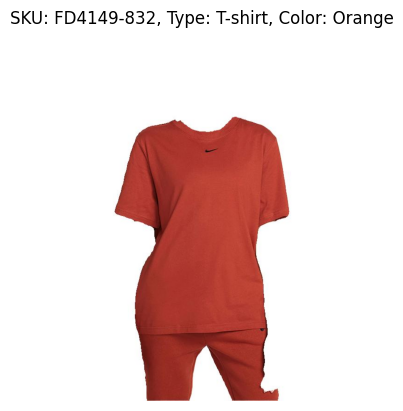

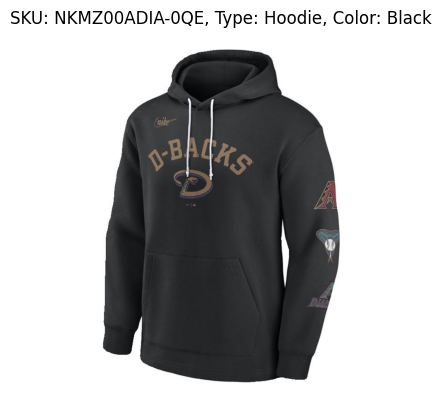

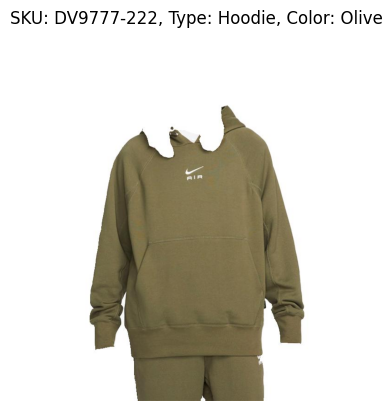

In [95]:
processed_images_files = [f for f in os.listdir(processed_images_dir) if f.endswith('.jpg')]

random_skus = random.sample(processed_images_files, 3)

for sku in random_skus:
    img_path = os.path.join(processed_images_dir, sku)
    img = Image.open(img_path).convert("RGB")

    sku_name = os.path.splitext(sku)[0]

    sku_row = df[df['sku'] == sku_name]
    if not sku_row.empty:
        label_name = sku_row['Type'].values[0]
        color_name = sku_row['Color'].values[0]

        plt.imshow(img)
        plt.title(f"SKU: {sku_name}, Type: {label_name}, Color: {color_name}")
        plt.axis('off')
        plt.show()
    else:
        print(f"SKU {sku_name} не знайдено в датафреймі.")

In [96]:
from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()

df['Type'] = label_encoder.fit_transform(df['Type'])

type_mapping = dict(zip(label_encoder.classes_, label_encoder.transform(label_encoder.classes_)))

type_mapping

{'Anorak': 0,
 'Backpack': 1,
 'Bomber': 2,
 'Boots': 3,
 'Cap': 4,
 'Dress': 5,
 'Football boots': 6,
 'Football sneakers': 7,
 'Full-zip Hoodie': 8,
 'Gumshoes': 9,
 'Hat': 10,
 'High boot': 11,
 'Hoodie': 12,
 'Jacket': 13,
 'Leggings': 14,
 'Longsleeve': 15,
 'Pants': 16,
 'Parka': 17,
 'Polo': 18,
 'Puffer jacket': 19,
 'Sandals': 20,
 'Shirt': 21,
 'Shoes': 22,
 'Shorts': 23,
 'Skirt': 24,
 'Slippers': 25,
 'Sneakers': 26,
 'Sweater': 27,
 'Sweatshirt': 28,
 'T-shirt': 29,
 'Tank-top': 30,
 'Top': 31,
 'Track-jacket': 32,
 'Vest': 33}

In [97]:
len(type_mapping)

34

In [98]:
from sklearn.model_selection import train_test_split

train_ratio = 0.8

grouped = df.groupby('Type')

train_list = []
val_list = []

for _, group in grouped:
    train, val = train_test_split(group, test_size=1 - train_ratio, random_state=42)
    train_list.append(train)
    val_list.append(val)

train_data = pd.concat(train_list).reset_index(drop=True)
val_data = pd.concat(val_list).reset_index(drop=True)

print(f"Train data size: {len(train_data)}")
print(f"Validation data size: {len(val_data)}")

Train data size: 221309
Validation data size: 55342


In [99]:
from torch.utils.data import Dataset
from PIL import Image
from tqdm import tqdm
import os

train_transform = transforms.Compose([
    transforms.Resize((img_size, img_size)),
    transforms.ToTensor(),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.Normalize(mean=[0.8329, 0.8211, 0.8254], std=[0.2497, 0.2639, 0.2580])
])

test_transform = transforms.Compose([
    transforms.Resize((img_size, img_size)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.8329, 0.8211, 0.8254], std=[0.2497, 0.2639, 0.2580])
])


class TransformDataset(Dataset):
    def __init__(self, dataframe, data_dir, transform=None):
        self.dataframe = dataframe.reset_index(drop=True)
        self.data_dir = data_dir
        self.transform = transform

    def __len__(self):
        return len(self.dataframe)

    def __getitem__(self, idx):
        if idx >= len(self.dataframe):
            raise IndexError(f"Index {idx} extends beyond the DataFrame")

        try:
            row = self.dataframe.iloc[idx:idx+1].squeeze()
        except KeyError as e:
            raise KeyError(f"Index access error {idx} in DataFrame: {e}")

        sku = row['sku']
        img_path = os.path.join(self.data_dir, f"{sku}.jpg")
        image = Image.open(img_path).convert("RGB")

        if self.transform:
            image = self.transform(image)

        label = row['Type']
        label = torch.tensor(label, dtype=torch.long)
        return image, label


train_dataset = TransformDataset(train_data, data_dir=data_dir, transform=train_transform)
val_dataset = TransformDataset(val_data, data_dir=data_dir, transform=test_transform)

print(f"Train Dataset size: {len(train_dataset)}")
print(f"Validation Dataset size: {len(val_dataset)}")

Train Dataset size: 221309
Validation Dataset size: 55342


In [100]:
train_loader = DataLoader(train_dataset, shuffle=True, batch_size=batch_size, num_workers=8, generator=generator, pin_memory=True)
val_loader = DataLoader(val_dataset, shuffle=False, batch_size=batch_size, num_workers=8, generator=generator, pin_memory=True)

In [ ]:
# means = []
# stds = []

# print("Calculation of mean values ​​and standard deviations for normalization:")
# for idx, (img, _) in enumerate(tqdm(val_dataset, desc="Calculating mean/std")):
#     if img.shape[0] == 3:
#         means.append(torch.mean(img, dim=[1, 2]).tolist())
#         stds.append(torch.std(img, dim=[1, 2]).tolist())
#     else:
#         filename = val_data.iloc[idx]['sku']
#         print(f"The image {filename} has an incorrect number of channels: {img.shape[0]}")

# mean = torch.mean(torch.tensor(means), dim=0)
# std = torch.mean(torch.tensor(stds), dim=0)

# mean, std

In [118]:
from torchvision import models

resnet152 = models.resnet152(pretrained=True)
resnet152

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [119]:
class TransferLearningClassifier(nn.Module):
    def __init__(self, num_classes=34):
        super().__init__()

        resnet = models.resnet152(pretrained=True)

        for param in resnet.parameters():
            param.requires_grad = False

        for param in resnet.layer4.parameters():
            param.requires_grad = True

        in_features = resnet.fc.in_features

        resnet.fc = nn.Identity()

        self.feature_extractor = resnet

        self.fc1 = nn.Linear(in_features, 512)
        self.dropout1 = nn.Dropout(0.3)
        self.fc2 = nn.Linear(512, 256)
        self.dropout2 = nn.Dropout(0.3)
        self.fc3 = nn.Linear(256, num_classes)

    def forward(self, x):
        out = self.feature_extractor(x)
        if isinstance(out, tuple):
            out = out[0]

        out = F.relu(self.fc1(out))
        out = self.dropout1(out)
        out = F.relu(self.fc2(out))
        out = self.dropout2(out)
        out = self.fc3(out)
        return out

    def predict(self, data_loader, device='cpu'):
        self.eval()
        all_preds = []

        with torch.no_grad():
            for inputs in data_loader:
                inputs = inputs.to(device)
                outputs = self(inputs)
                preds = F.softmax(outputs, dim=-1)
                all_preds.append(preds.cpu().numpy())

        return np.concatenate(all_preds, axis=0)

model = TransferLearningClassifier(num_classes=len(train_data['Type'].unique())).to(device)

In [120]:
from torchsummary import summary

summary(model, input_size=(3, img_size, img_size))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 112, 112]           9,408
       BatchNorm2d-2         [-1, 64, 112, 112]             128
              ReLU-3         [-1, 64, 112, 112]               0
         MaxPool2d-4           [-1, 64, 56, 56]               0
            Conv2d-5           [-1, 64, 56, 56]           4,096
       BatchNorm2d-6           [-1, 64, 56, 56]             128
              ReLU-7           [-1, 64, 56, 56]               0
            Conv2d-8           [-1, 64, 56, 56]          36,864
       BatchNorm2d-9           [-1, 64, 56, 56]             128
             ReLU-10           [-1, 64, 56, 56]               0
           Conv2d-11          [-1, 256, 56, 56]          16,384
      BatchNorm2d-12          [-1, 256, 56, 56]             512
           Conv2d-13          [-1, 256, 56, 56]          16,384
      BatchNorm2d-14          [-1, 256,

In [121]:
class_counts = df['Type'].value_counts()

total_samples = len(df)

class_weights = {cls: total_samples / count for cls, count in class_counts.items()}

weights = torch.tensor([class_weights[cls] for cls in sorted(class_counts.index)], dtype=torch.float32).to(device)

weights

tensor([716.7125, 171.4071, 343.2394,  55.2308, 141.1485, 214.1262,  72.2704, 138.6722,  78.0838,  27.9192, 289.9906, 545.6627,  17.9539,  23.8041,  66.4707,  40.8522,  12.7489, 372.3432,  73.6361, 148.4179, 159.4530,  80.6563, 185.0508,  15.5439, 331.3186,  47.1377,   3.5361,  49.2174,  32.7824,   6.6793,  54.0440,
         70.8816,  79.4061, 192.6539], device='cuda:0')

In [122]:
loss_fn = nn.CrossEntropyLoss(weight=weights)

optimizer = torch.optim.AdamW(model.parameters(), lr=1e-4, weight_decay=1e-5)

In [123]:
import time
from torch.cuda.amp import autocast, GradScaler

def train(model, optimizer, loss_fn, train_dl, val_dl, scheduler=None,
          metrics=None, metrics_name=None, epochs=20, device=device, task='regression', log_interval=1):
    # Ініціалізація скейлера для змішаної точності
    scaler = GradScaler()

    metrics = metrics if metrics else []
    metrics_name = metrics_name if metrics_name else [metric.__name__ for metric in metrics]

    history = {}
    history['loss'] = []
    history['val_loss'] = []
    for name in metrics_name:
        history[name] = []
        history[f'val_{name}'] = []

    model.to(device)

    start_time_train = time.time()

    for epoch in range(epochs):
        start_time_epoch = time.time()

        model.train()
        history_train = {name: 0 for name in ['loss'] + metrics_name}

        for batch in train_dl:
            x = batch[0].to(device)
            y = batch[1].to(device)

            optimizer.zero_grad()

            # Використання змішаної точності
            with autocast():
                y_pred = model(x)
                loss = loss_fn(y_pred, y)

            # Масштабуємо втрату і backward
            scaler.scale(loss).backward()

            # Оновлюємо ваги через скейлер
            scaler.step(optimizer)
            scaler.update()

            y_pred = y_pred.detach().cpu().numpy()
            y = y.detach().cpu().numpy()

            history_train['loss'] += loss.item() * x.size(0)
            for name, func in zip(metrics_name, metrics):
                try:
                    if func == roc_auc_score:
                        # Перевіряємо, чи присутні обидва класи в y
                        if len(np.unique(y)) == 2:
                            history_train[name] += func(y, y_pred) * x.size(0)
                    else:
                        history_train[name] += func(y, y_pred) * x.size(0)
                except:
                    if task == 'binary':
                        y_pred_ = y_pred.round()
                    elif task == 'multiclass':
                        y_pred_ = y_pred.argmax(axis=-1)
                    history_train[name] += func(y, y_pred_) * x.size(0)

        for name in history_train:
            history_train[name] /= len(train_dl.dataset)

        model.eval()
        history_val = {'val_' + name: 0 for name in metrics_name + ['loss']}

        with torch.no_grad():
            for batch in val_dl:
                x = batch[0].to(device)
                y = batch[1].to(device)

                with autocast():
                    y_pred = model(x)
                    loss = loss_fn(y_pred, y)

                y_pred = y_pred.cpu().numpy()
                y = y.cpu().numpy()

                history_val['val_loss'] += loss.item() * x.size(0)
                for name, func in zip(metrics_name, metrics):
                    try:
                        if func == roc_auc_score:
                            if len(np.unique(y)) == 2:
                                history_val['val_' + name] += func(y, y_pred) * x.size(0)
                        else:
                            history_val['val_' + name] += func(y, y_pred) * x.size(0)
                    except:
                        if task == 'binary':
                            y_pred_ = y_pred.round()
                        elif task == 'multiclass':
                            y_pred_ = y_pred.argmax(axis=-1)

                        history_val['val_' + name] += func(y, y_pred_) * x.size(0)

        for name in history_val:
            history_val[name] /= len(val_dl.dataset)

        end_time_epoch = time.time()

        for name in history_train:
            history[name].append(history_train[name])
            history['val_' + name].append(history_val['val_' + name])

        total_time_epoch = end_time_epoch - start_time_epoch

        if epoch + 1 == 1 or (epoch + 1) % log_interval == 0 or epoch + 1 == epochs:
            print(f'Epoch {epoch + 1:4d} {total_time_epoch:4.0f}sec', end='\t')
            for name in history_train:
                print(f'{name}: {history[name][-1]:10.3g}', end='\t')
                print(f"val_{name}: {history['val_' + name][-1]:10.3g}", end='\t')
            print()

        if scheduler:
            if isinstance(scheduler, ReduceLROnPlateau):
                scheduler.step(history_val['val_loss'][-1])
            else:
                scheduler.step()

    end_time_train = time.time()
    total_time_train = end_time_train - start_time_train
    print()
    print('Time total:     %5.2f sec' % (total_time_train))

    return history

In [ ]:
# import time

# def train(model, optimizer, loss_fn, train_dl, val_dl, scheduler=None,
#           metrics=None, metrics_name=None, epochs=20, device=device, task='regression', log_interval=1):
#     metrics = metrics if metrics else []
#     metrics_name = metrics_name if metrics_name else [metric.__name__ for metric in metrics]

#     history = {}
#     history['loss'] = []
#     history['val_loss'] = []
#     for name in metrics_name:
#         history[name] = []
#         history[f'val_{name}'] = []

#     model.to(device)

#     start_time_train = time.time()

#     for epoch in range(epochs):
#         start_time_epoch = time.time()

#         model.train()
#         history_train = {name: 0 for name in ['loss'] + metrics_name}

#         for batch in train_dl:
#             x = batch[0].to(device)
#             y = batch[1].to(device)
#             y_pred = model(x)
#             loss = loss_fn(y_pred, y)

#             optimizer.zero_grad()
#             loss.backward()
#             optimizer.step()

#             y_pred = y_pred.detach().cpu().numpy()
#             y = y.detach().cpu().numpy()

#             history_train['loss'] += loss.item() * x.size(0)
#             for name, func in zip(metrics_name, metrics):
#                 try:
#                     if func == roc_auc_score:
#                         # Check if there are both classes present in y
#                         if len(np.unique(y)) == 2:
#                             history_train[name] += func(y, y_pred) * x.size(0)
#                     else:
#                         history_train[name] += func(y, y_pred) * x.size(0)
#                 except:
#                     if task == 'binary':
#                         y_pred_ = y_pred.round()
#                     elif task == 'multiclass':
#                         y_pred_ = y_pred.argmax(axis=-1)
#                     history_train[name] += func(y, y_pred_) * x.size(0)

#         for name in history_train:
#             history_train[name] /= len(train_dl.dataset)

#         model.eval()
#         history_val = {'val_' + name: 0 for name in metrics_name + ['loss']}

#         with torch.no_grad():
#             for batch in val_dl:
#                 x = batch[0].to(device)
#                 y = batch[1].to(device)
#                 y_pred = model(x)
#                 loss = loss_fn(y_pred, y)

#                 y_pred = y_pred.cpu().numpy()
#                 y = y.cpu().numpy()

#                 history_val['val_loss'] += loss.item() * x.size(0)
#                 for name, func in zip(metrics_name, metrics):
#                     try:
#                         if func == roc_auc_score:
#                             # Check if there are both classes present in y
#                             if len(np.unique(y)) == 2:
#                                 history_val['val_' + name] += func(y, y_pred) * x.size(0)
#                         else:
#                             history_val['val_' + name] += func(y, y_pred) * x.size(0)
#                     except:
#                         if task == 'binary':
#                             y_pred_ = y_pred.round()
#                         elif task == 'multiclass':
#                             y_pred_ = y_pred.argmax(axis=-1)

#                         history_val['val_' + name] += func(y, y_pred_) * x.size(0)

#         for name in history_val:
#             history_val[name] /= len(val_dl.dataset)

#         end_time_epoch = time.time()

#         for name in history_train:
#             history[name].append(history_train[name])
#             history['val_' + name].append(history_val['val_' + name])

#         total_time_epoch = end_time_epoch - start_time_epoch

#         if epoch + 1 == 1 or (epoch + 1) % log_interval == 0 or epoch + 1 == epochs:
#             print(f'Epoch {epoch + 1:4d} {total_time_epoch:4.0f}sec', end='\t')
#             for name in history_train:
#                 print(f'{name}: {history[name][-1]:10.3g}', end='\t')
#                 print(f"val_{name}: {history['val_' + name][-1]:10.3g}", end='\t')
#             print()

#         if scheduler:
#             if isinstance(scheduler, ReduceLROnPlateau):
#                 scheduler.step(history_val['val_loss'][-1])
#             else:
#                 scheduler.step()

#     end_time_train = time.time()
#     total_time_train = end_time_train - start_time_train
#     print()
#     print('Time total:     %5.2f sec' % (total_time_train))

#     return history

In [ ]:
from sklearn.metrics import accuracy_score, roc_auc_score

history = train(model, optimizer, loss_fn, train_loader, val_loader,
                epochs=40,
                metrics=[accuracy_score],
                device=device,
                task='multiclass',
               log_interval=2)

In [ ]:
import matplotlib.pyplot as plt

def plot_metric(history, name):
    plt.title(f"Model results with {name}")
    plt.plot(history[name], label='train')
    plt.plot(history['val_'+name], label='val')
    plt.xlabel('Epoch')
    plt.ylabel(name)
    plt.legend()


plot_metric(history, 'loss')

In [ ]:
plot_metric(history, 'accuracy_score')

In [ ]:
inverse_type_mapping = {v: k for k, v in type_mapping.items()}

model = model.to('cpu')
model.eval()

y_pred = []
y_true = []

with torch.no_grad():
    for X, y in val_loader:
        y_true.extend(y.cpu().numpy())
        X = X.to('cpu')
        y_pred_ = model(X)
        y_pred_ = y_pred_.argmax(-1).cpu().numpy()
        y_pred.extend(y_pred_)

y_true_text = [inverse_type_mapping[label] for label in y_true]
y_pred_text = [inverse_type_mapping[label] for label in y_pred]

class_labels = [inverse_type_mapping[i] for i in sorted(inverse_type_mapping.keys())]

fig, ax = plt.subplots(figsize=(15, 15))
ConfusionMatrixDisplay.from_predictions(y_true_text, y_pred_text, display_labels=class_labels, ax=ax)
plt.xticks(rotation=90)
plt.show()

In [ ]:
model_save_path = 'C:/Users/klimk/Desktop/Nike/model.pth'
torch.save(model.state_dict(), model_save_path)
print(f"Model saved to {model_save_path}")